In [1]:
import pandas as pd
from bs4 import BeautifulSoup
from urllib.request import urlopen, Request
import time, datetime
import matplotlib.pyplot as plt
import re, math

from web_commons import extract_table_by_class, flatten_df, extract_compound_tables
from web_commons import fetch_scrip_data, extract_scrip_ratios, get_screener_data
from commons import read_xls, get_stock_data, NSE_BSE, BSE_NSE, save_csv, get_holding_quantities
from consts import CONSOLIDATED_NOT_AVAILABLE_ON_SCREENER, OUT_DIR

In [2]:
ATTRIBUTES = [
                'Return on Equity',  #'^ROE', # Just a flat number not time series
#               '\[ROE\]', # Just for BAJFINANCE
                'Compounded Profit Growth', 
                'Compounded Sales Growth', 
                '\[NetProfit\]\[[JFMASOND]', 
                '\[NetProfit\]\[Qtr]', 
                '\[Sales\]\[[JFMASOND]', 
                '\[Sales\]\[Qtr]', 
                '\[EPSinRs\]\[[JFMASOND]', 
                '\[EPSinRs\]\[Qtr]',
                '\[Promoters\]\[[JFMASOND]',
                '\[FIIs\]\[[JFMASOND]',
                '\[DIIs\]\[[JFMASOND]',
                '\[Public\]\[[JFMASOND]'
]

df = pd.DataFrame()

In [3]:
def sort_cols(cols): 
    if re.findall("\[[JFMASOND][a-z]+[0-9]+\]", cols[0]):
        cols.sort(key=lambda x: datetime.datetime.strptime(x.rsplit('[', 1)[-1].replace(']', ''), '%b%Y'))

    return cols

def rename_col_names(df, cols, series=False):
#     col_name_maps = {c:c.replace(re.findall(g, c)[0], '').replace('[', '').replace(']', '') for c in cols}
    col_name_maps = {c:c.rsplit('[', 1)[-1].replace(']', '') for c in cols}
    df = df[cols]
    
    if series:
        df = df.rename(col_name_maps)
    else:
        df = df.rename(columns=col_name_maps)

    return df

def get_plot_dim():
    l = len(ATTRIBUTES)
    r = math.ceil(math.sqrt(l))+1
    c = math.ceil(l/r)
    
    return r, c

def get_title_from_attributes(attr):
    name = attr.split(']', 1)[0].replace('\\', '').replace('[', '') 
    if 'Qtr' in attr:
        name += 'Qtr'
    
    return name

def plot_attribute_per_scrip(df, png_folder_name='fundamental_data/', save_pngs=False):
    for attr in ATTRIBUTES:
        cols = [c for c in df.columns if re.findall(attr, c)]
        cols = sort_cols(cols)

        f = rename_col_names(df, cols).T[get_holding_quantities().keys()].fillna(method='ffill').plot(subplots=True, layout=(9,3), figsize=(35,20), 
                                                                               grid=True, sharex=False)

        ax = f[0][0]
        fig = ax.get_figure()
        fig.tight_layout()
        fig.subplots_adjust(top=0.95)

        fig.suptitle(get_title_from_attributes(attr), fontsize=20)
        fig.patch.set_linewidth(10)
        fig.patch.set_edgecolor('cornflowerblue')
        
        if save_pngs:
            fig.savefig(f'{OUT_DIR}{png_folder_name}{get_title_from_attributes(attr)}.png') #, edgecolor=fig.get_edgecolor())
            print(f'Wrote: {OUT_DIR}{png_folder_name}{get_title_from_attributes(attr)}.png')

def plot_scrips_with_attributes(df, png_folder_name='fundamental_data/', save_pngs=False):
    for scrip in get_holding_quantities():

        # scrip = 'BAJFINANCE'
        nrows, ncols = get_plot_dim()
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(35, 20))
        fig.suptitle(scrip, fontsize=30)
        fig.tight_layout()
        fig.subplots_adjust(top=0.93)
        fig.patch.set_linewidth(10)
        fig.patch.set_edgecolor('cornflowerblue')

        df_c = df.loc[scrip]
        g_num = 0
        for i in range(nrows):
            for j in range(ncols):
                if g_num == len(ATTRIBUTES):
                    break

                attr = ATTRIBUTES[g_num] #'Return on Equity'
                cols = [c for c in df_c.keys() if re.findall(attr, c)]
                cols = sort_cols(cols)
                df1 = rename_col_names(df_c, cols, series=True)
                df1 = df1.fillna(method='ffill') #df1.dropna()
                df1.plot(ax=axes[i][j], title=get_title_from_attributes(attr), grid=True)
                g_num += 1
                
        if save_pngs:
            fig.savefig(f'{OUT_DIR}{png_folder_name}{scrip}.png') #, edgecolor=fig.get_edgecolor())
            print(f'Wrote: {OUT_DIR}{png_folder_name}{scrip}.png')

def write_pngs_to_html(png_folder_name='fundamental_data/'):
    png_names = [get_title_from_attributes(g) for g in ATTRIBUTES]
    png_names += [s for s in get_holding_quantities()]
    
    html = "<!DOCTYPE html>\n"
    html += "<HTML>\n"
    html += "<BODY>\n"
    for p in png_names:
        html += '\t<img src="{}.png">\n'.format(p)
        html += '<BR>'
    html += "</BODY>"
    html += "</HTML>"

    with open(f"{OUT_DIR}{png_folder_name}index.html", "w") as html_file:
        html_file.write(html)

def add_data_from_prev_csv(curr_df, csv_name, index_col='Scrip'):
    df_prev = pd.read_csv(csv_name, index_col=index_col)
    old_not_in_new = list(set([c for c in df_prev.columns]) - set([c for c in curr_df.columns]))
    print(f'Adding old columns not in new data: {old_not_in_new}')
    
    for c in old_not_in_new:
        curr_df[c] = df_prev[c]
        
    return curr_df

In [4]:
df = get_screener_data(scrips = ['BAJFINANCE', 'DMART', 'DEEPAKNTR', 'SONACOMS'])

********** BAJFINANCE
********** DMART
********** DEEPAKNTR
********** SONACOMS


array([[<AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>]], dtype=object)

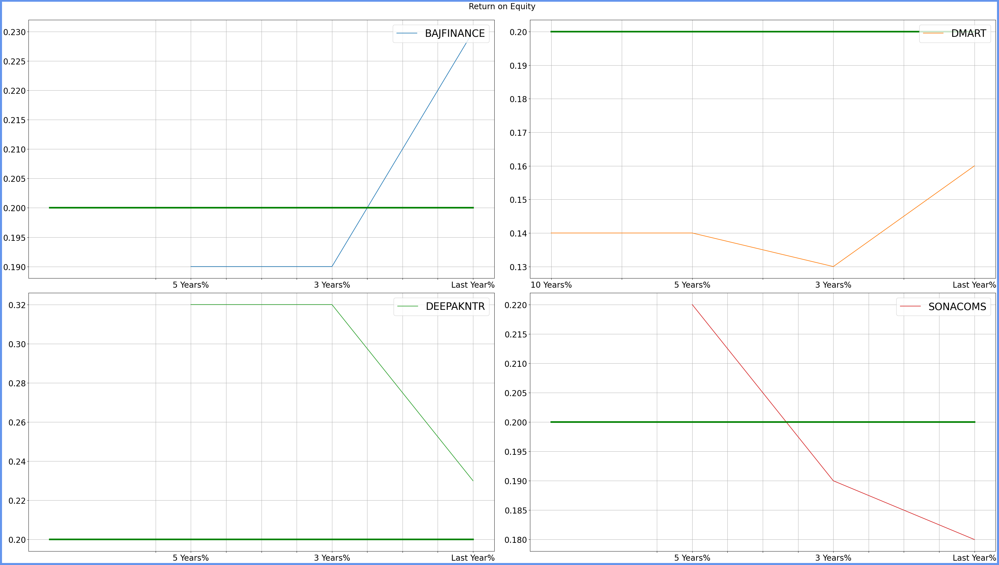

In [77]:
attr = 'Return on Equity'
cols = [c for c in df.columns if re.findall(attr, c)]
cols = sort_cols(cols)


attr_df = rename_col_names(df, cols).T[['BAJFINANCE', 'DMART', 'DEEPAKNTR', 'SONACOMS']].fillna(method='ffill')

f = attr_df.plot(subplots=True, layout=(2,2), figsize=(35,20), grid=True, sharex=False)
# attr_df.loc[:, :] = .25
# f = f.plot(subplots=True, layout=(2,2), figsize=(35,20), grid=True, sharex=False)
# plt.tight_layout()

for ax in plt.gcf().axes:
    ax.legend(fontsize = 25, loc='upper right') #loc=1
#     print(dir(ax))
#     print(ax.get_xticks())
#     ax.set_ylabel('crapppp')
    ax.plot(attr_df.index.values.tolist(), [.2]*len(attr_df.index.values), c='g', linewidth=4)
    ax.tick_params(axis='x', which='both', labelsize=20)
    ax.tick_params(axis='y', which='both', labelsize=20)


#     plt.xticks(fontsize = 15)
    

# for i in range(2):
#     for j in range(2):
#         f[i][j].plot([])
#         df1.plot(ax=axes[i][j], title=get_title_from_attributes(attr), grid=True)



ax = f[0][0]
fig = ax.get_figure()
fig.tight_layout()
fig.subplots_adjust(top=0.95)

fig.suptitle(get_title_from_attributes(attr), fontsize=20)
fig.patch.set_linewidth(10)
fig.patch.set_edgecolor('cornflowerblue')

f

In [47]:
attr_df = rename_col_names(df, cols).T[['BAJFINANCE', 'DMART', 'DEEPAKNTR', 'SONACOMS']].fillna(method='ffill')
print(attr_df.columns)
attr_df.loc[:, :] = .25
attr_df.index.values.tolist()

Index(['BAJFINANCE', 'DMART', 'DEEPAKNTR', 'SONACOMS'], dtype='object', name='Scrip')


['10 Years%', '5 Years%', '3 Years%', 'Last Year%']

df already loaded, using from cache!
Adding old columns not in new data: []
Saved: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/screener_dump_20240120140102.csv
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/Return on Equity.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/Compounded Profit Growth.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/Compounded Sales Growth.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/NetProfit.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/NetProfitQtr.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/Sales.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/SalesQtr.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/EPSinRs.png
Wrote: /Users/aniron/Docum

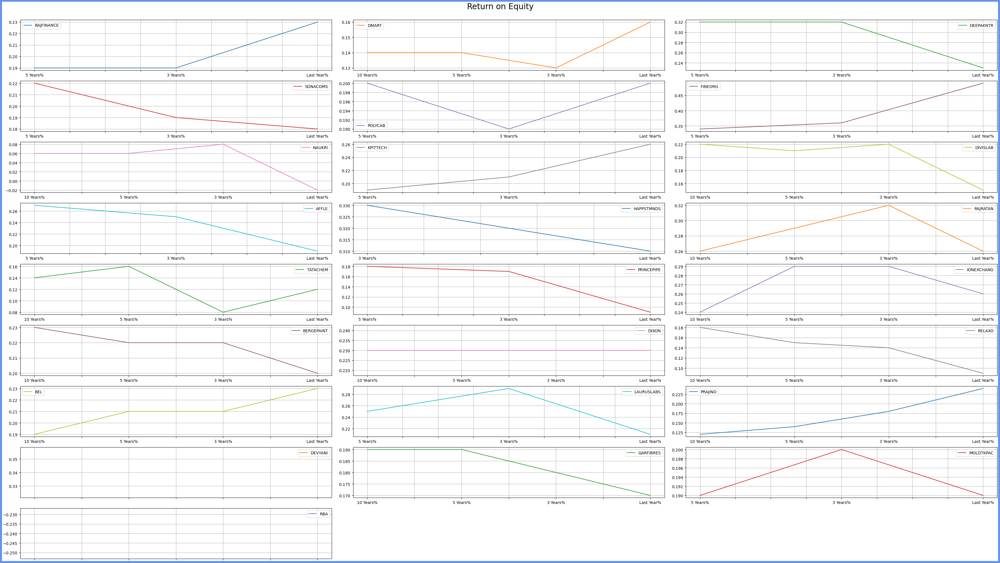

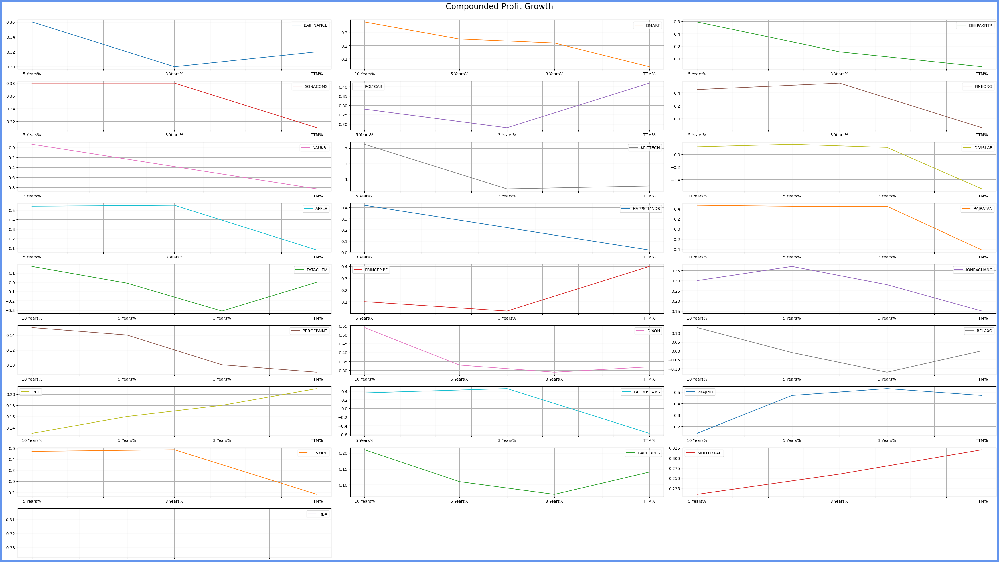

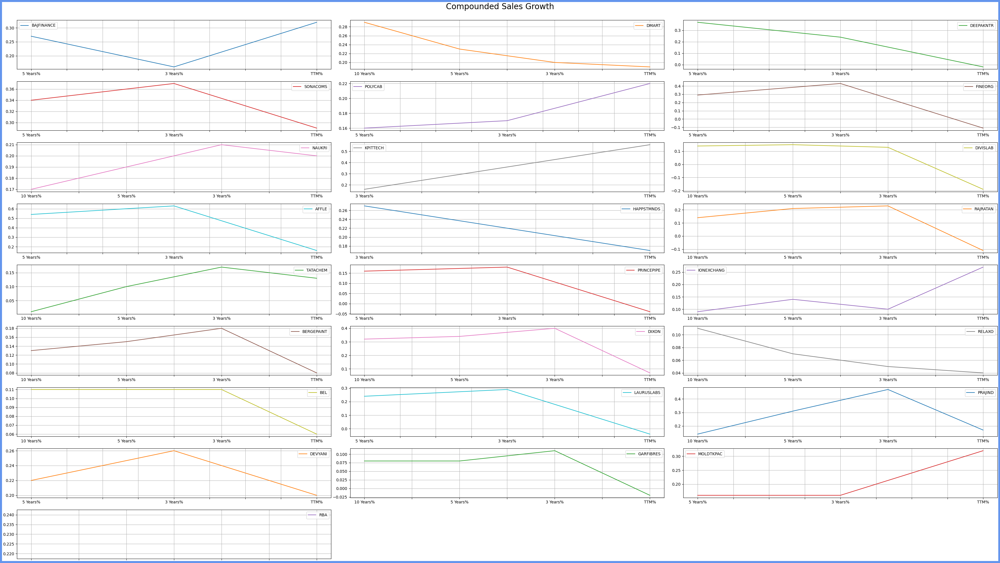

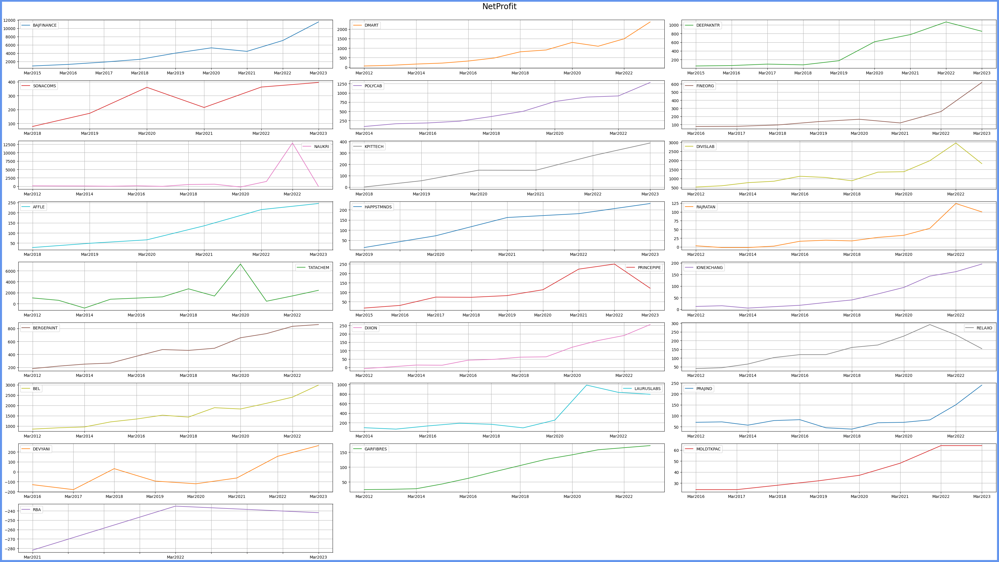

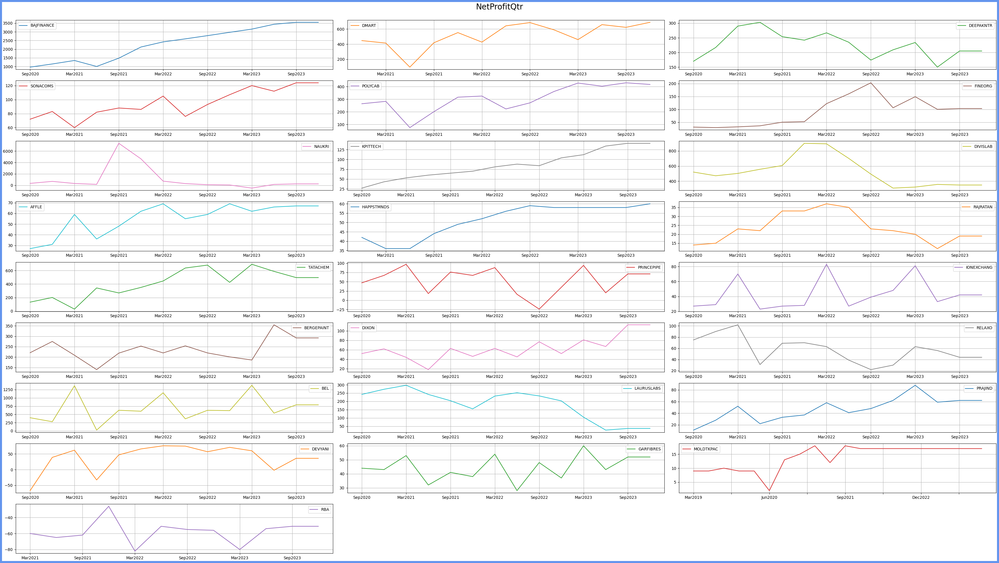

...

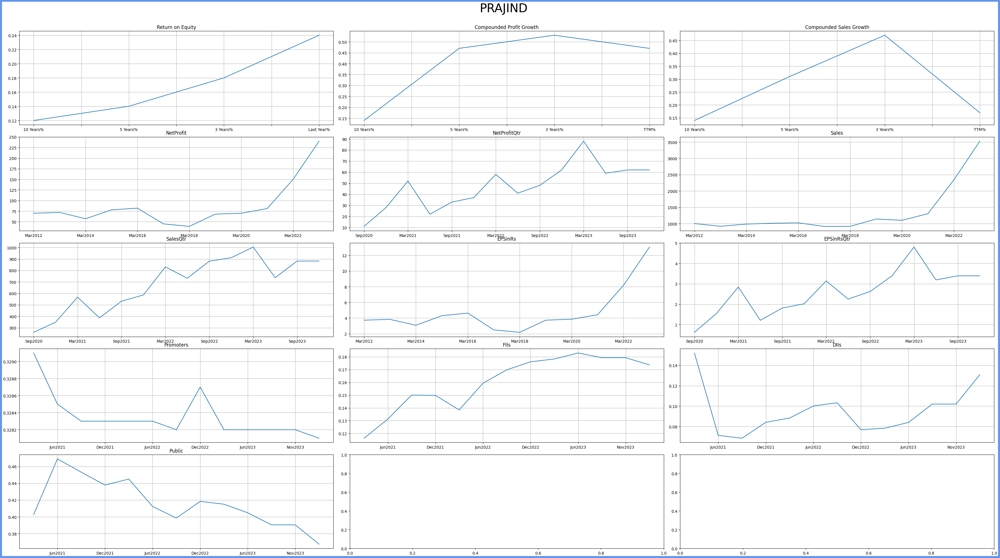

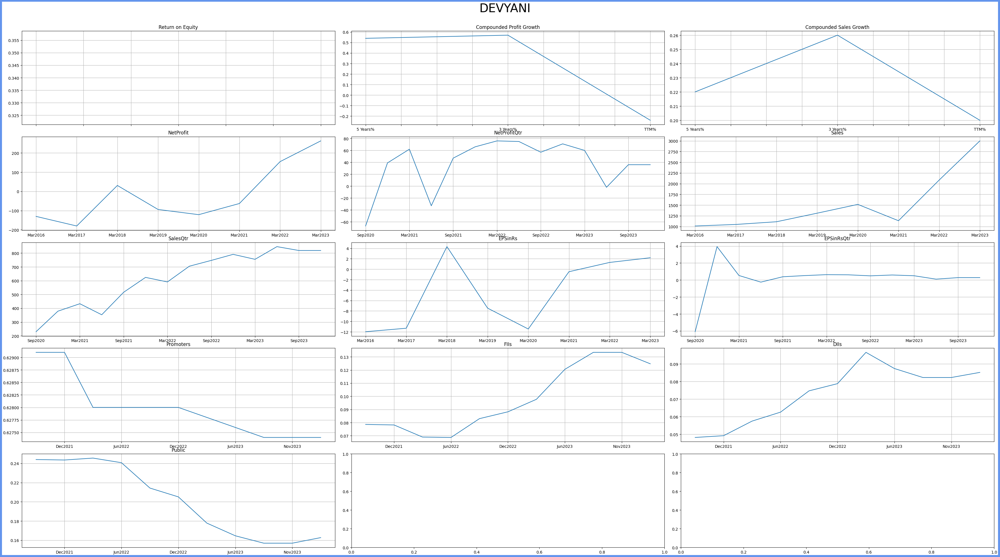

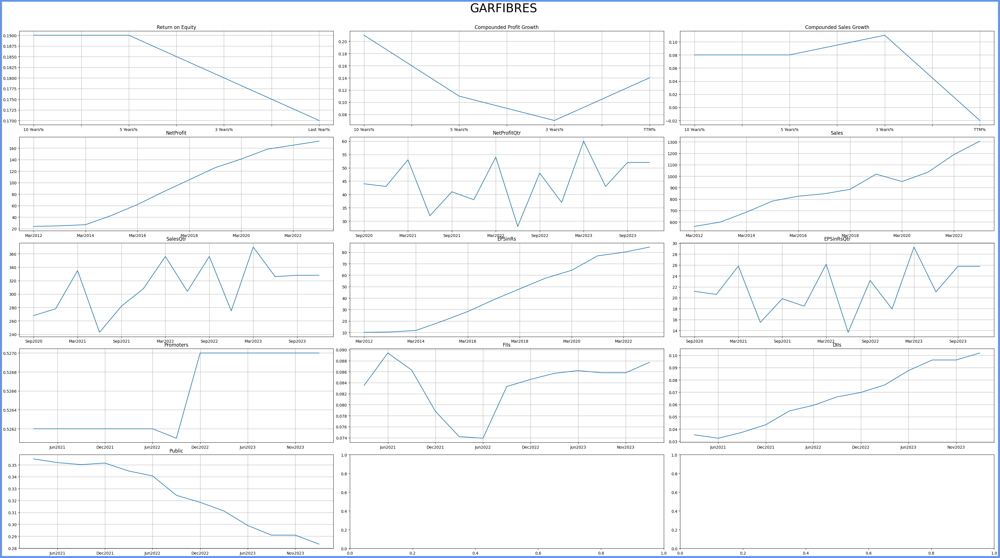

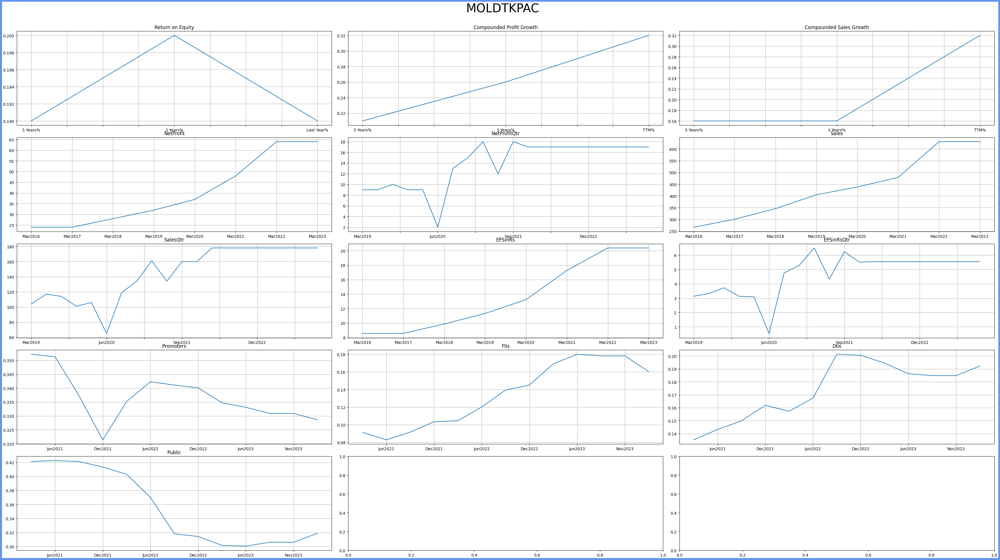

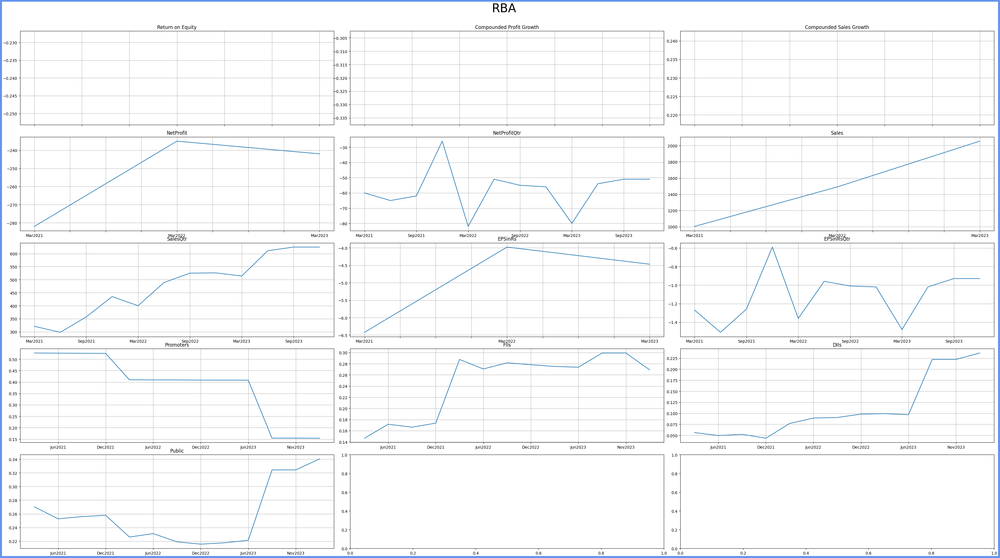

In [8]:
# TODO - get the pngs dynamically instead of hard coded in HTML file
# TODO - move html to common and include historical/charts pngs

# OLD_CSV_DUMP = 'screener_dump_20240104214359.csv'
OLD_CSV_DUMP = 'screener_dump_20240120055349.csv' ### TODO: pick last file automatically?

if df.empty:
    df = get_screener_data()
else:
    print('df already loaded, using from cache!')
    
df = add_data_from_prev_csv(df, f'{OUT_DIR}{OLD_CSV_DUMP}')
save_csv(df, 'screener_dump')

plot_attribute_per_scrip(df, save_pngs=True)
plot_scrips_with_attributes(df, save_pngs=True)
write_pngs_to_html()

In [5]:
# # for scrip, q in get_holding_quantities():
# #     print(scrip, q)
# # get_holding_quantities()
df_c = df.loc['DMART']
cols = [c for c in df_c.keys() if re.findall('\[Public\]\[[JFMASOND]', c)]
cols = sort_cols(cols)

print(cols)
df1 = rename_col_names(df_c, cols, series=True)
# df1=df1.dropna()
df1 = df1.fillna(method='ffill')
print(df1)
df1.plot(title=get_title_from_attributes(attr), grid=True)



['[Public][Dec2020]', '[Public][Mar2021]', '[Public][Jun2021]', '[Public][Sep2021]', '[Public][Dec2021]', '[Public][Mar2022]', '[Public][Jun2022]', '[Public][Sep2022]', '[Public][Dec2022]', '[Public][Mar2023]', '[Public][Jun2023]', '[Public][Sep2023]', '[Public][Nov2023]', '[Public][Dec2023]']
Dec2020       NaN
Mar2021    0.0826
Jun2021    0.0826
Sep2021    0.0829
Dec2021    0.0883
Mar2022    0.0942
Jun2022    0.0952
Sep2022    0.0923
Dec2022    0.0924
Mar2023    0.0937
Jun2023    0.0949
Sep2023    0.0941
Nov2023    0.0941
Dec2023    0.0887
Name: DMART, dtype: float64


NameError: name 'attr' is not defined

In [ ]:
# save_csv(df, 'screener_dump')

In [ ]:
df.drop('BAJFINANCE')
df.drop('NAUKRI')


df

In [ ]:
cols = ['[NetProfit][Qtr][Sep2020]', '[NetProfit][Qtr][Dec2020]', '[NetProfit][Qtr][Mar2021]', 
        '[NetProfit][Qtr][Jun2021]', '[NetProfit][Qtr][Sep2021]', '[NetProfit][Qtr][Dec2021]', 
        '[NetProfit][Qtr][Mar2022]', '[NetProfit][Qtr][Jun2022]', '[NetProfit][Qtr][Sep2022]', 
        '[NetProfit][Qtr][Dec2022]', '[NetProfit][Qtr][Mar2023]', '[NetProfit][Qtr][Jun2023]', 
        '[NetProfit][Qtr][Sep2023]', '[NetProfit][Qtr][Mar2019]', '[NetProfit][Qtr][Jun2019]', 
        '[NetProfit][Qtr][Sep2019]', '[NetProfit][Qtr][Dec2019]', '[NetProfit][Qtr][Mar2020]', 
        '[NetProfit][Qtr][Jun2020]']

# my_strings.sort(key=lambda date: datetime.strptime(date, '%d.%m.%y time %H.%M'))
d = cols[0].rsplit('[', 1)[-1].replace(']', '')
print(d)
datetime.datetime.strptime(d, '%b%Y')
cols.sort(key=lambda x: datetime.datetime.strptime(x.rsplit('[', 1)[-1].replace(']', ''), '%b%Y'))
cols




In [ ]:
g = '\[NetProfit\]\[Qtr]'
c = '[NetProfit][Qtr][Mar2019]'
# g = '\[Sales\]\[[JFMASOND]'
c = '[Sales][Mar2012]'
c = '[Return on Equity][10 Years]%'
# c.replace(re.findall(g, c)[0], '').replace('[', '').replace(']', '')
c.rsplit('[', 1)[-1].replace(']', '')
g.split(']', 1)[0].replace('\\', '').replace('[', '')

g.split(']', 1)[0].replace('\\', '').replace('[', '') 

In [ ]:
for attr in ATTRIBUTES:
    cols = [c for c in df.columns if re.findall(attr, c)]
    cols = sort_cols(cols)
    df[5:10][cols].T.plot(grid=True, figsize=(20,20)) # partial graph

In [ ]:
df.loc['BAJFINANCE'][['Market Cap', 'Current Price']]

dict(df.loc['BAJFINANCE']).keys()
df.loc['BAJFINANCE'][cols].plot()
df.loc['BAJFINANCE'][cols]